In [1]:
### import libraries ###
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

#Prepare data for PCA and unsupervised learning models

In [2]:
# # # Run it if it is the first time you running this notebook.
# # # Mount your google drive to colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
X = pd.read_csv('/content/drive/MyDrive/Capstone/Data/X_raw.csv')
X.drop(columns=['Unnamed: 0'], inplace=True) # drop index col
X.name = 'X'

y = pd.read_csv('/content/drive/MyDrive/Capstone/Data/y_raw.csv')
y.drop(columns=['Unnamed: 0'], inplace=True) # drop index col
y.name = 'y'

X.head()

,id_01,id_02,id_05,id_06,id_11,id_12,id_13,id_15,id_16,id_17,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,0.0,70787.0,NaN,NaN,100.0,NotFound,NaN,New,NotFound,166.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-5.0,98945.0,0.0,-5.0,100.0,NotFound,49.0,New,NotFound,166.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-5.0,191631.0,0.0,0.0,100.0,NotFound,52.0,Found,Found,121.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,-5.0,221832.0,0.0,-6.0,100.0,NotFound,52.0,New,NotFound,225.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,0.0,7460.0,1.0,0.0,100.0,NotFound,NaN,Found,Found,166.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
X_null = X.isnull().sum(axis=0).to_frame() # count Nans in every col.
X_null.rename(columns={0: '#_Nans'}, inplace=True) # rename cols.
# create dataframe that contains columns with more than 1 Nan
df_temp = X_null[X_null['#_Nans']>0]

In [5]:
#find columns that only have Nan and drop them
for c in df_temp.index.tolist():
    if len(X[c].unique())<=1:
          print(c )

dist1
D11


In [6]:
X=X.drop(columns=['dist1', 'D11'], inplace=False)

## Create encoding for categorical vairables


In [7]:
categorical_columns = X.dtypes[X.dtypes == np.object].index.tolist() # list of columns with categorical variables

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """Entry point for launching an IPython kernel.


In [8]:
#create ordinal encoders for categorical variables
from sklearn.preprocessing import OrdinalEncoder
oe = OrdinalEncoder( dtype=int)
oe.fit(X[categorical_columns])
X[categorical_columns] = oe.transform(X[categorical_columns]) 

In [9]:
X.shape

(134833, 410)

##fill Nan

In [10]:
### Step 1:
# filter out the cols with Nans.
X_null = X.isnull().sum(axis=0).to_frame() # count Nans in every col.
X_null.rename(columns={0: '#_Nans'}, inplace=True) # rename cols.
X_NanCols = X_null[X_null['#_Nans']>0].index # get a series contains all the names of cols with Nan.

X_fullCols = X_null[X_null['#_Nans']==0].index   # column names without NA

# make lists, indicating which stratage will be used in imputing the cols.
cols_fill_mean = []
cols_fill_freq = []

for col in X_NanCols:
  if str(col).startswith('C'): # cols C1-C1
    cols_fill_freq.append(col)
  elif str(col).startswith('D'): # cols D1-D15 and 'Device ...' which has been filled previously.
    cols_fill_freq.append(col)
  else:
    cols_fill_mean.append(col) # cols id_XX and cols has already been filled with other startages earlier.

# make all the cols still included in the following processing
cols_fill_freq.extend(X_fullCols.to_list())

In [11]:

# Step 2:
# instantiate the imputers, within a pipeline
# imputer imputes with the mean
imp_mean = Pipeline(steps=[('imputer', SimpleImputer(missing_values=np.nan, strategy='mean'))])


# imputer imputes with 'most_frequent'
imp_freq = Pipeline(steps=[('imputer',SimpleImputer(missing_values=np.nan, strategy='most_frequent'))])

# Step 3:
# put the features list and the transformers together by col transformer.
imp_preprocessor = ColumnTransformer(transformers=[('imp_mean', imp_mean, cols_fill_mean),\
                                                   ('imp_freq',imp_freq,cols_fill_freq)])#,remainder='passthrough' )
    
                                                             

In [12]:
# Step 4:
# fit and trans the dataset with 'imp_preprocessor'.

imp_preprocessor.fit(X)
X_train = imp_preprocessor.transform(X) 

##create a dataframe df_PCA that have Nan filled and encodings created for categorical variables

In [13]:
# create a dataframe to be used for PCA and unsupervised learning
df_PCA = pd.DataFrame(imp_preprocessor .fit_transform(X), columns=X.columns, index=X.index)

In [14]:
df_PCA   

,id_01,id_02,id_05,id_06,id_11,id_12,id_13,id_15,id_16,id_17,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,70787.0,1.673235,-6.893552,48.949996,166.0,542.0,144.0,514.0,150.0,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,98945.0,0.000000,-5.000000,49.000000,166.0,621.0,500.0,100.0,150.0,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,191631.0,0.000000,0.000000,52.000000,121.0,410.0,142.0,352.0,117.0,134.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,221832.0,0.000000,-6.000000,52.000000,225.0,176.0,507.0,375.0,185.0,224.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,7460.0,1.000000,0.000000,48.949996,166.0,529.0,575.0,555.0,150.0,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134828,145955.0,0.000000,0.000000,27.000000,225.0,427.0,139.0,305.0,106.0,224.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
134829,172059.0,1.000000,-5.000000,27.000000,166.0,352.0,333.0,174.0,150.0,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
134830,632381.0,-1.000000,-36.000000,27.000000,225.0,567.0,411.0,555.0,185.0,137.0,...,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
134831,55528.0,0.000000,-7.000000,27.000000,166.0,352.0,368.0,583.0,150.0,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
# df_PCA.to_csv('df_PCA.csv')
# !cp df_PCA.csv "drive/MyDrive/Capstone/Data/"

In [16]:
X_train.shape

(134833, 410)

In [17]:
y_train=y

# k-means with PCA

##PCA

###Variance Ratio Plot

(0.0, 30.0)

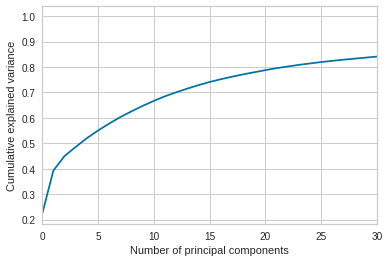

In [18]:

#Create graph to see the relationship between number of principal components and explained variance. 
X_df = df_PCA
scalar = StandardScaler()
X_scaled = pd.DataFrame(scalar.fit_transform(X_df), columns=X_df.columns)

pca = PCA().fit(X_scaled)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of principal components')
plt.ylabel('Cumulative explained variance')

plt.xlim([0, 30])

Selecting 15 Principal Components will explain ~75% of the variance. We need only the calculated resulting components scores based on the 15 principla components for the elements in our data set:


perform PCA with the chosen 15 principle components.

In [19]:
pca15=PCA(n_components=15)

In [20]:
score_PCA=pca15.fit_transform(X_scaled)

In [21]:
score_PCA.shape

(134833, 15)

##K-means clustering into 2 clusters(fraud and nonfraud)  with PCA results

We used Kmeans to group data into two groups with PCA results.

In [22]:
from sklearn.cluster import KMeans
kmeans_PCA=KMeans(n_clusters=2,init="k-means++",random_state=42)

In [23]:
#fit data after PCA with k-means model
kmeans_PCA.fit_predict(score_PCA)

array([1, 1, 0, ..., 0, 1, 0], dtype=int32)

In [24]:
#create a dataframe with PCA scores and assigned cluster
df_pca_kmeans=pd.concat([df_PCA.reset_index(drop=True),pd.DataFrame(score_PCA)],axis=1)
df_pca_kmeans.columns.values[-15:]=["component 1","component 2","component 3","component 4",
                                    "component 5","component 6","component 7","component 8",
                                    "component 9","component 10","component 11","component 12",
                                    "component 13","component 14","component 15"]

In [25]:
#add a column for the assigned cluster
df_pca_kmeans['pca_kmeans_cluster']=kmeans_PCA.labels_

In [26]:
df_pca_kmeans.head()

,id_01,id_02,id_05,id_06,id_11,id_12,id_13,id_15,id_16,id_17,...,component 7,component 8,component 9,component 10,component 11,component 12,component 13,component 14,component 15,pca_kmeans_cluster
0,70787.0,1.673235,-6.893552,48.949996,166.0,542.0,144.0,514.0,150.0,102.0,...,0.029751,-1.376910,3.254433,2.477150,-5.694068,-0.302634,0.520055,-0.048669,-0.485371,1
1,98945.0,0.000000,-5.000000,49.000000,166.0,621.0,500.0,100.0,150.0,226.0,...,0.064848,-1.404469,3.296856,2.525999,-5.680042,-0.196563,0.491228,-0.151130,-0.502677,1
2,191631.0,0.000000,0.000000,52.000000,121.0,410.0,142.0,352.0,117.0,134.0,...,-3.426103,2.722683,-2.719259,-7.398746,-5.374654,-3.838442,-3.490594,-1.881397,-3.197093,0
3,221832.0,0.000000,-6.000000,52.000000,225.0,176.0,507.0,375.0,185.0,224.0,...,-0.419498,-0.314726,1.100892,1.175310,0.502754,0.677478,1.113355,-1.694342,-1.154255,0
4,7460.0,1.000000,0.000000,48.949996,166.0,529.0,575.0,555.0,150.0,226.0,...,-0.041034,-1.187276,2.803357,1.885473,-6.060398,-1.568238,-0.102509,1.744121,-0.173541,1


##result of two clusters

In [27]:
df_pca_kmeans['pca_kmeans_cluster'].value_counts()

1    75175
0    59658
Name: pca_kmeans_cluster, dtype: int64

###Visualize 2 Clusters by Principle Components 

In [28]:
#create a dataframe with only the last 16 columns of df_pca_kmeans
PCA_columns  = df_pca_kmeans.iloc[: , -16:]

In [29]:
#df_pca_kmeans .to_csv('df_pca_kmeans.csv')
#!cp df_pca_kmeans.csv "drive/MyDrive/Capstone/Data/"

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<function matplotlib.pyplot.show>

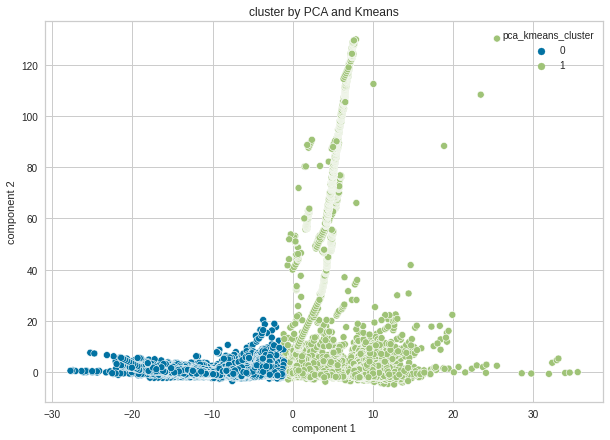

In [30]:
#visualize two clusters in 2D scatterplot
import seaborn as sns
x_axis=PCA_columns ["component 1"]
y_axis=PCA_columns ["component 2"]
plt.figure(figsize=(10,7))
sns.scatterplot(x_axis,y_axis,hue=PCA_columns ['pca_kmeans_cluster'])
plt.title("cluster by PCA and Kmeans")
plt.show

In [31]:
#plot in a 3D scatter plot
import plotly.express as px
fig = px.scatter_3d(PCA_columns, x='component 1', y='component 2', z='component 3', color='pca_kmeans_cluster',                 
                    width=700,
                    height=700)                 
#fig.update_layout(showlegend=False)
fig.show()

## Conduct Elbow distortion method to find ideal number of clusters with PCA data

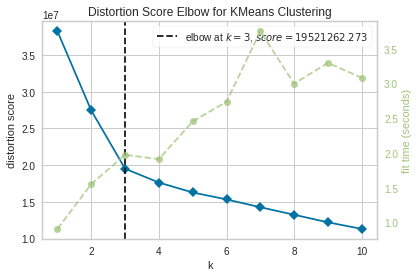

In [32]:
#Conduct Elbow distortion method to find ideal number of clusters with PCA data
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,11))
visualizer.fit(score_PCA)    
visualizer.show()  

the number of clusters to be chosen  should be equal to 3.

##Kmeans clustering into 3 clusters with PCA results

In [33]:
kmeans_PCA_3=KMeans(n_clusters=3,init="k-means++",random_state=42)
#fit data after PCA with k-means model
kmeans_PCA_3.fit_predict(score_PCA)

array([1, 1, 0, ..., 0, 1, 0], dtype=int32)

In [34]:
#create a dataframe with PCA scores and assigned cluster
df_pca_kmeans_3clus=pd.concat([df_PCA.reset_index(drop=True),pd.DataFrame(score_PCA)],axis=1)
df_pca_kmeans_3clus.columns.values[-15:]=["component 1","component 2","component 3","component 4",
                                    "component 5","component 6","component 7","component 8",
                                    "component 9","component 10","component 11","component 12",
                                    "component 13","component 14","component 15"]

In [35]:
#add a column for the assigned cluster
df_pca_kmeans_3clus['pca_kmeans_cluster']=kmeans_PCA_3.labels_

In [36]:
df_pca_kmeans_3clus.head()

,id_01,id_02,id_05,id_06,id_11,id_12,id_13,id_15,id_16,id_17,...,component 7,component 8,component 9,component 10,component 11,component 12,component 13,component 14,component 15,pca_kmeans_cluster
0,70787.0,1.673235,-6.893552,48.949996,166.0,542.0,144.0,514.0,150.0,102.0,...,0.029751,-1.376910,3.254433,2.477150,-5.694068,-0.302634,0.520055,-0.048669,-0.485371,1
1,98945.0,0.000000,-5.000000,49.000000,166.0,621.0,500.0,100.0,150.0,226.0,...,0.064848,-1.404469,3.296856,2.525999,-5.680042,-0.196563,0.491228,-0.151130,-0.502677,1
2,191631.0,0.000000,0.000000,52.000000,121.0,410.0,142.0,352.0,117.0,134.0,...,-3.426103,2.722683,-2.719259,-7.398746,-5.374654,-3.838442,-3.490594,-1.881397,-3.197093,0
3,221832.0,0.000000,-6.000000,52.000000,225.0,176.0,507.0,375.0,185.0,224.0,...,-0.419498,-0.314726,1.100892,1.175310,0.502754,0.677478,1.113355,-1.694342,-1.154255,0
4,7460.0,1.000000,0.000000,48.949996,166.0,529.0,575.0,555.0,150.0,226.0,...,-0.041034,-1.187276,2.803357,1.885473,-6.060398,-1.568238,-0.102509,1.744121,-0.173541,1


###result of 3 clusters

In [37]:
df_pca_kmeans_3clus['pca_kmeans_cluster'].value_counts()

1    73974
0    59713
2     1146
Name: pca_kmeans_cluster, dtype: int64

###visualize 3 clusters

In [38]:
#create a dataframe with only the last 16 columns of df_pca_kmeans
PCA_columns_3clus  = df_pca_kmeans_3clus.iloc[: , -16:]

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<function matplotlib.pyplot.show>

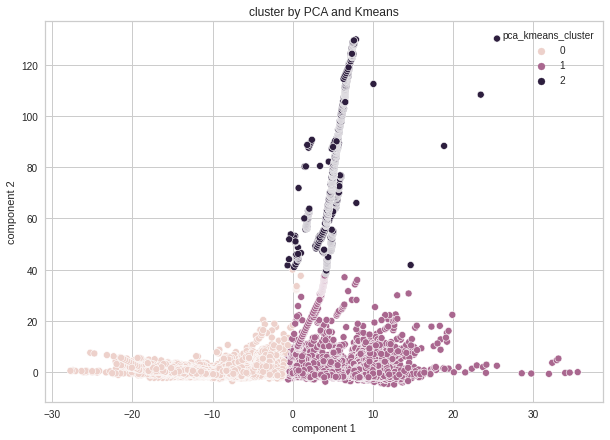

In [39]:
#visualize two clusters in 2D scatterplot
import seaborn as sns
x_axis=PCA_columns_3clus  ["component 1"]
y_axis=PCA_columns_3clus  ["component 2"]
plt.figure(figsize=(10,7))
sns.scatterplot(x_axis,y_axis,hue=PCA_columns_3clus ['pca_kmeans_cluster'])
plt.title("cluster by PCA and Kmeans")
plt.show

In [40]:
#plot in a 3D scatter plot
import plotly.express as px
fig = px.scatter_3d(PCA_columns_3clus , x='component 1', y='component 2', z='component 3', color='pca_kmeans_cluster',                 
                    width=800,
                    height=800)                 
#fig.update_layout(showlegend=False)
fig.show()

##Compare Silhouette score and Davies Bouldin Score for clusters of 2 and 3

In [42]:
for num in range(2,4):
    kmeans = KMeans(n_clusters=num)
    kmeans.fit_predict(score_PCA)
    assigning_clusters = kmeans.labels_    
    print("Silhouette Score for k = " + str(num) + " " + str(silhouette_score(score_PCA, assigning_clusters)))
    print("Davies Bouldin Score for k = " + str(num) + " " + str(davies_bouldin_score(score_PCA, assigning_clusters))) 


Silhouette Score for k = 2 0.51955167082425
Davies Bouldin Score for k = 2 0.8544359491339434
Silhouette Score for k = 3 0.5448779363037562
Davies Bouldin Score for k = 3 0.7105319462779572


Two clusters has a lower Silhouette score and a higher Davies Bouldin Score than three clusters.

Silhouette Score close to 1 implies that the instance is close to its cluster is a part of the right cluster. Thus, 3 clusters has a better silhouette score than 2 clusters.Optimal clustering has the smallest Davies–Bouldin index value.

This is an interesting finding--there could be two types of fraud transactions or two types of non-fraud transactions.